In [1]:
import os
import sys
import json
import random
import pandas as pd
import numpy as np
import scipy.stats as stats
from datetime import datetime
from PIL import Image
import cv2
import torch
from torch.utils.data import Dataset, DataLoader
from torchvision.transforms import ToTensor, Normalize, Lambda, Compose

np.random.seed(44)
torch.manual_seed(44)

np.set_printoptions(precision=3)
pd.set_option('display.max_rows', None)

import seaborn as sns 
import matplotlib.pyplot as plt
from matplotlib import rc
%matplotlib inline
rc('font', family='NanumGothic')
plt.rcParams['axes.unicode_minus'] = False
plt.rcParams['figure.figsize'] = [20, 16]

import plotly.graph_objects as go
import plotly.io as pio   
import plotly.express as px
from plotly.subplots import make_subplots

from IPython.display import display, HTML
display(HTML("<style>.container { width:80% !important; }</style>"))
display(HTML("<style>div.output_scroll { height: 100em; }</style>"))
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.max_colwidth', 200)

import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
warnings.simplefilter(action='ignore', category=DeprecationWarning)

import sklearn.neighbors._base
sys.modules['sklearn.neighbors.base'] = sklearn.neighbors._base

import re
re_num = re.compile(r'([0-9\.]+)(.*)')

#import env
os.getcwd()

'/home/kikim/Projects/ai_data_2022'

# 데이터 읽기 / 전처리

## 메타데이터

In [2]:
base_dir = '/home/kikim/data/ai_data_230102/processed/'
label_dir = os.path.join(base_dir, '라벨링데이터')

In [3]:
import re
import json

In [4]:
def sort_elements_by_specimen_id(elements, delim='_', id_idx=0):
    ids = [d.split(delim)[id_idx] for d in elements]
    ids = [int(i) for i in ids if i.isdigit()]
    
    return [d for i, d in sorted(zip(ids, elements))]


def sort_dirs_by_specimen_id(root_dir):
    return sort_elements_by_specimen_id(os.listdir(root_dir))


def select_dict_by_keys(_dict, keys=None):
    if keys is None:
        keys = _dict.keys()
        
    return {k:v for k, v in _dict.items() if k in keys}


def read_json_files(label_dir, suffix_path, keys=None):
    meta_dict = {}
    for d in sort_dirs_by_specimen_id(label_dir):
        specimen_id = d.split('_')[0]

        json_dir = os.path.join(label_dir, d, suffix_path)
        if not os.path.exists(json_dir):
            continue

        _json_files = [f for f in os.listdir(json_dir) if f.endswith('.json')]
        if len(_json_files) == 0:
            continue

        with open(os.path.join(json_dir, _json_files[0])) as f:
            _json_dict = json.load(f)

        meta_dict[int(specimen_id)] = select_dict_by_keys(_json_dict, keys)
        
    return meta_dict


def read_json_files__melt_temp(label_dir, suffix_path, keys=None, melt_temp_key='max_temperature'):
    meta_dict = {}
    for d in sort_dirs_by_specimen_id(label_dir):
        specimen_id = d.split('_')[0]

        json_dir = os.path.join(label_dir, d, suffix_path)
        if not os.path.exists(json_dir):
            continue

        _json_files = [f for f in os.listdir(json_dir) if f.endswith('.json')]
        if len(_json_files) == 0:
            continue

        with open(os.path.join(json_dir, _json_files[0])) as f:
            _json_dict = json.load(f)

        meta_dict[int(specimen_id)] = select_dict_by_keys(_json_dict, keys)
        
        _max_temp_list = []
        for f_name in sort_elements_by_specimen_id(os.listdir(json_dir)):
            _json_path = os.path.join(json_dir, f_name)
            if not _json_path.endswith('.json') or not os.path.exists(_json_path):
                continue

            with open(_json_path) as f:
                _json_dict = json.load(f)

            _max_temp_list.append(_json_dict[melt_temp_key])

        if len(_max_temp_list) > 0:
            _json_dict = select_dict_by_keys(_json_dict, keys)
            _json_dict[melt_temp_key] = [float(t) for t in _max_temp_list]
            meta_dict[int(specimen_id)] = _json_dict
        
    return meta_dict

def convert_value_to_float(json_dict):
    regex = re.compile('(\d+\.?\d*)([^-]*)')
    
    _converted_json_dict = {}
    for k, v in json_dict.items():
        if isinstance(v, str):
            m = regex.match(v)
            if m is not None:
                v = m.groups()[0]
                _converted_json_dict[k] = float(v)
        
        if k not in _converted_json_dict:
            _converted_json_dict[k] = v
            
    return _converted_json_dict

In [5]:
variable_names = ['material.name', 'material.size', 
                  'equipment.name', 'equipment.chamber.oxygen.density', 'equipment.chamber.temp',
                  'equipment.chamber.oxygen.density', 'equipment.base.hd',
                  'condition.laser.power', 'condition.scan.speed', 'condition.lamination.direction',
                  'specimen.position', 
                  'yielding.stress', 'tensile.stress', 'elongation', 'density', #'distortion.x'
                 ]

In [6]:
on_axis_meta_dict = read_json_files(label_dir, 'On_Axis_Images/JSON', variable_names)
off_axis_meta_dict = read_json_files(label_dir, 'Off_Axis_Images/JSON', variable_names)
melt_temp_meta_dict = read_json_files__melt_temp(label_dir, 'melt_temperature', variable_names)

In [7]:
on_axis_meta_dict = { k:convert_value_to_float(v) for k, v in on_axis_meta_dict.items() }
off_axis_meta_dict = { k:convert_value_to_float(v) for k, v in off_axis_meta_dict.items() }
melt_temp_meta_dict = { k:convert_value_to_float(v) for k, v in melt_temp_meta_dict.items() }

In [8]:
on_axis_meta_dict

{1: {'material.name': 'SUS',
  'material.size': 30.0,
  'equipment.name': 'Vulcan 300',
  'equipment.chamber.oxygen.density': 0.1,
  'equipment.chamber.temp': 20.0,
  'equipment.base.hd': 0.1,
  'condition.laser.power': 264.0,
  'condition.scan.speed': 700.0,
  'condition.lamination.direction': 0.0,
  'yielding.stress': 503.55,
  'tensile.stress': 603.84,
  'elongation': 25.7,
  'density': 7.76,
  'specimen.position': 1.0},
 2: {'material.name': 'SUS',
  'material.size': 30.0,
  'equipment.name': 'Vulcan 300',
  'equipment.chamber.oxygen.density': 0.1,
  'equipment.chamber.temp': 20.0,
  'equipment.base.hd': 0.1,
  'condition.laser.power': 312.0,
  'condition.scan.speed': 700.0,
  'condition.lamination.direction': 0.0,
  'yielding.stress': 476.22,
  'tensile.stress': 611.24,
  'elongation': 40.4,
  'density': 7.71,
  'specimen.position': 2.0},
 3: {'material.name': 'SUS',
  'material.size': 30.0,
  'equipment.name': 'Vulcan 300',
  'equipment.chamber.oxygen.density': 0.1,
  'equipment.

In [9]:
df_on_axis = pd.DataFrame.from_dict(on_axis_meta_dict, orient='index')
df_on_axis['laser_density'] = df_on_axis['condition.laser.power'] / df_on_axis['condition.scan.speed']

In [10]:
df_off_axis = pd.DataFrame.from_dict(off_axis_meta_dict, orient='index')
df_off_axis['laser_density'] = df_off_axis['condition.laser.power'] / df_off_axis['condition.scan.speed']

In [11]:
for k, _dict in melt_temp_meta_dict.items():
    _melt_temps = np.array(_dict['max_temperature'])
    _dict['max_temperature__mean'] = _melt_temps.mean()
    _dict['max_temperature__max'] = _melt_temps.max()
    _dict['max_temperature__min'] = _melt_temps.min()
    _dict['max_temperature__median'] = _melt_temps.min()
    _ = _dict.pop('max_temperature')
    

In [12]:
df_melt_temp = pd.DataFrame.from_dict(melt_temp_meta_dict, orient='index')

In [13]:
df_on_axis.loc[df_on_axis['density'] < 0.1, :]

,material.name,material.size,equipment.name,equipment.chamber.oxygen.density,equipment.chamber.temp,equipment.base.hd,condition.laser.power,condition.scan.speed,condition.lamination.direction,yielding.stress,tensile.stress,elongation,density,specimen.position,laser_density


In [14]:
df_on_axis.iloc[1680:1696, :]

,material.name,material.size,equipment.name,equipment.chamber.oxygen.density,equipment.chamber.temp,equipment.base.hd,condition.laser.power,condition.scan.speed,condition.lamination.direction,yielding.stress,tensile.stress,elongation,density,specimen.position,laser_density
1682,MARAGING,30.0,CM 150,0.1,25.0,0.6,200.0,600.0,90.0,1062.0,1122.0,6.90,7.91,15.0,0.333333
1683,MARAGING,30.0,CM 150,0.1,25.0,0.6,180.0,600.0,90.0,1060.0,1110.0,5.55,7.95,15.0,0.300000
1684,MARAGING,30.0,CM 150,0.1,25.0,0.6,160.0,600.0,90.0,1029.0,1058.0,3.20,8.02,15.0,0.266667
1685,MARAGING,30.0,CM 150,0.1,25.0,0.6,120.0,1100.0,90.0,196.0,220.0,0.80,7.25,14.0,0.109091
1686,MARAGING,30.0,CM 150,0.1,25.0,0.6,100.0,1100.0,90.0,120.0,122.0,0.55,6.73,14.0,0.090909
1687,MARAGING,30.0,CM 150,0.1,25.0,0.6,120.0,900.0,90.0,225.0,394.0,1.20,7.63,14.0,0.133333
1688,MARAGING,30.0,CM 150,0.1,25.0,0.6,100.0,900.0,90.0,216.0,237.0,1.20,7.08,13.0,0.111111
1689,MARAGING,30.0,CM 150,0.1,25.0,0.6,200.0,1100.0,90.0,489.0,573.0,2.25,7.92,12.0,0.181818
1690,MARAGING,30.0,CM 150,0.1,25.0,0.6,180.0,1100.0,90.0,496.0,507.0,1.80,7.87,11.0,0.163636
1691,MARAGING,30.0,CM 150,0.1,25.0,0.6,160.0,1100.0,90.0,248.0,346.0,1.65,7.30,11.0,0.145455


In [15]:
vars_to_plot = ['condition.laser.power', 'condition.scan.speed', 'laser_density', 'yielding.stress', 'tensile.stress', 'elongation', 'density']


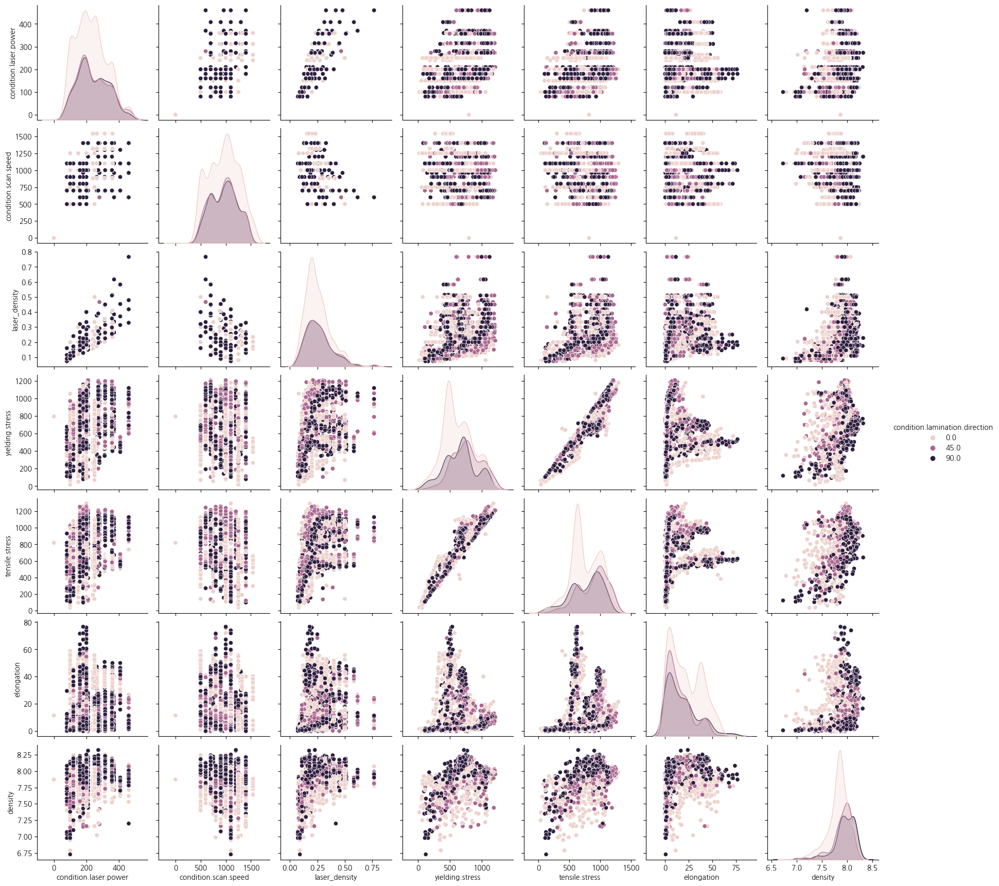

In [16]:
sns.pairplot(df_on_axis, 
             x_vars=vars_to_plot,
             y_vars=vars_to_plot,
             hue='condition.lamination.direction')

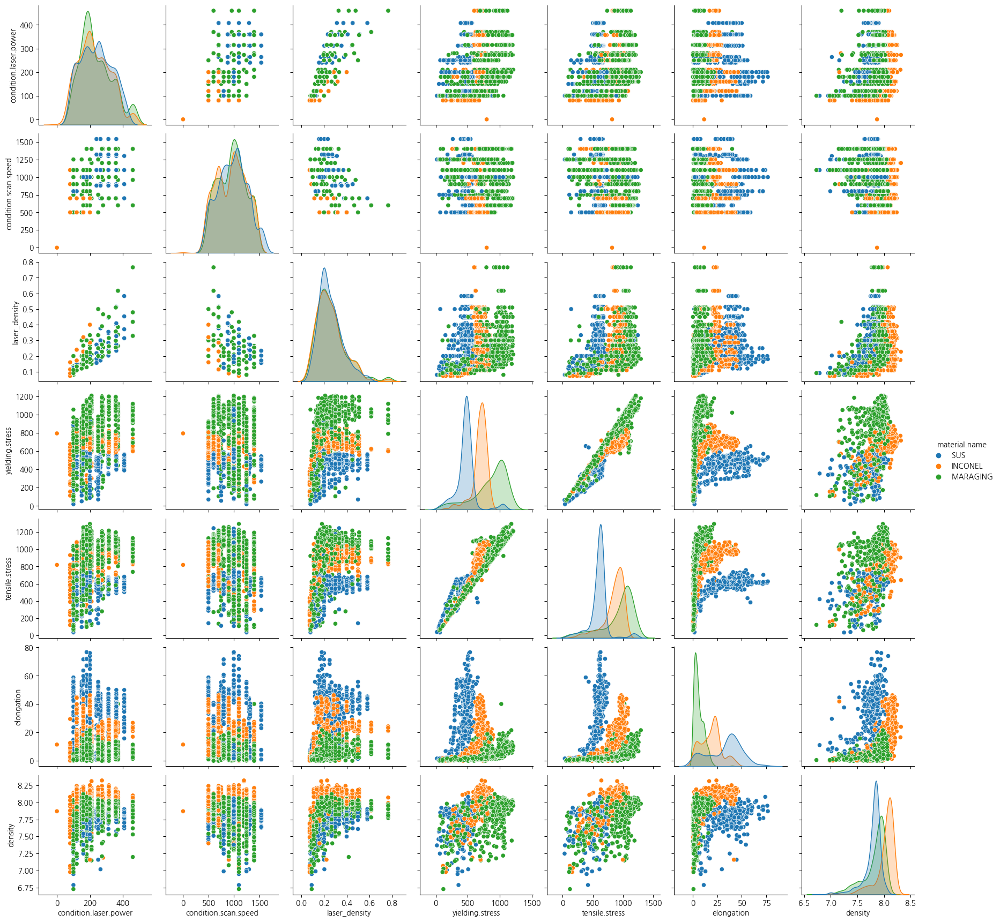

In [17]:
sns.pairplot(df_on_axis, 
             x_vars=vars_to_plot,
             y_vars=vars_to_plot,
             hue='material.name')

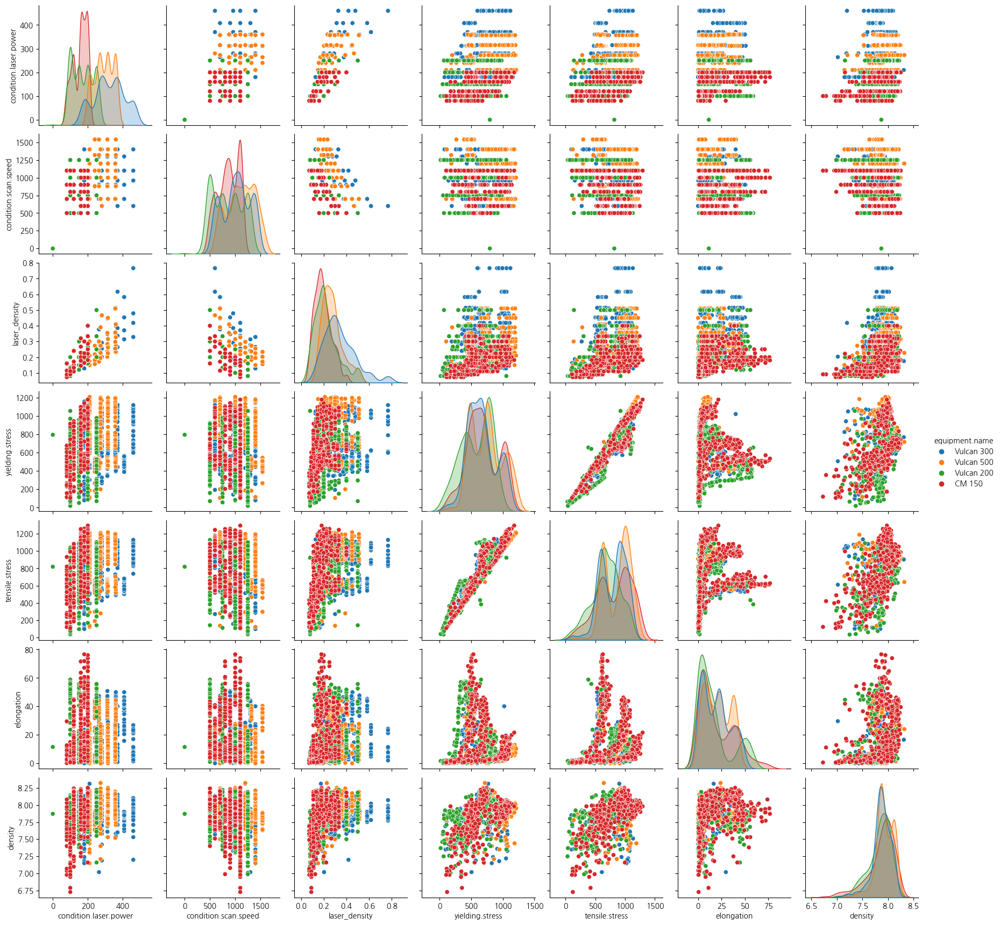

In [18]:
sns.pairplot(df_on_axis, 
             x_vars=vars_to_plot,
             y_vars=vars_to_plot,
             hue='equipment.name')

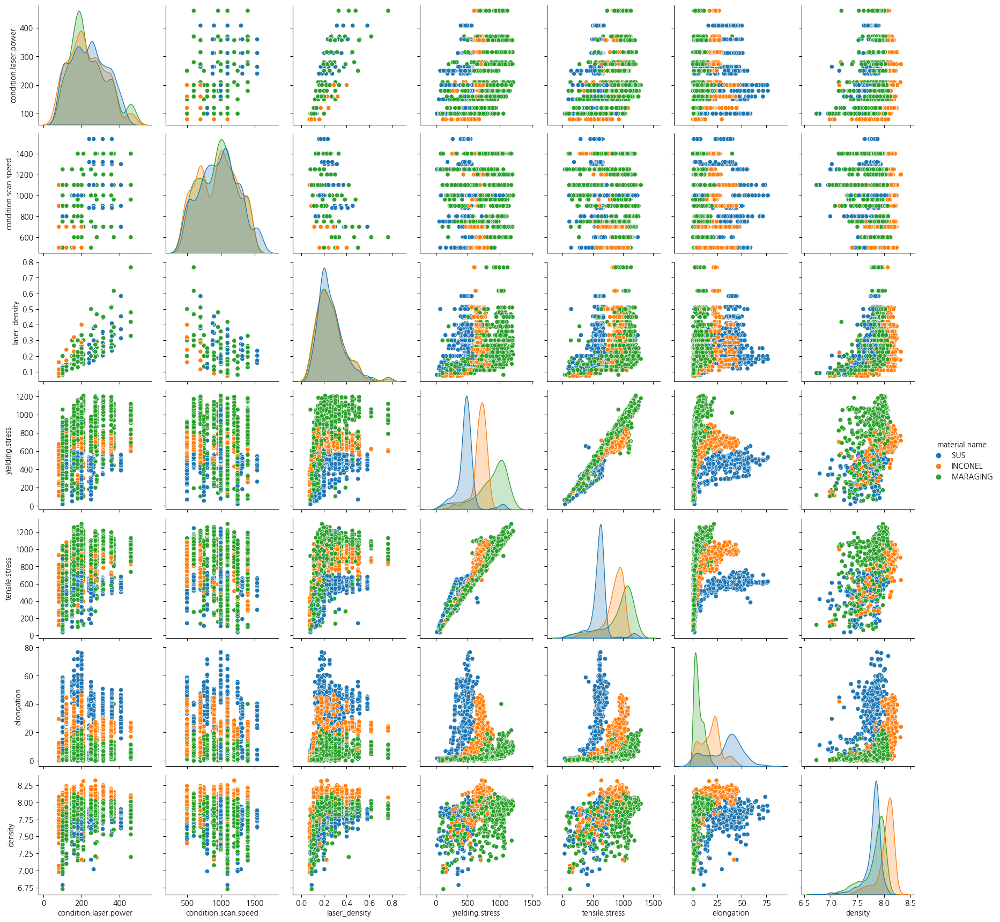

In [19]:
sns.pairplot(df_off_axis, 
             x_vars=vars_to_plot,
             y_vars=vars_to_plot,
             hue='material.name')

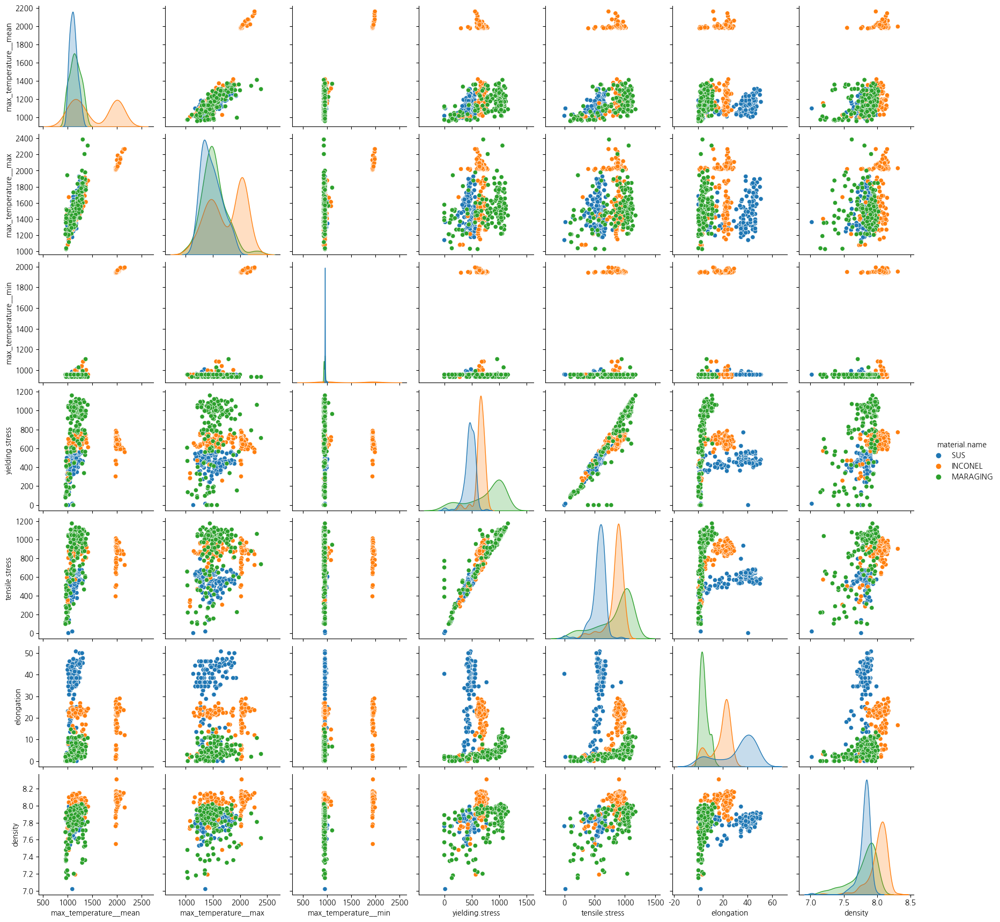

In [20]:
vars_to_plot = ['max_temperature__mean', 'max_temperature__max', 'max_temperature__min', 'yielding.stress', 'tensile.stress', 'elongation', 'density']
sns.pairplot(df_melt_temp, 
             x_vars=vars_to_plot,
             y_vars=vars_to_plot,
             hue='material.name')

## Video Data

In [21]:
image_dir = os.path.join(base_dir, '원천데이터')

In [22]:
specimen_dirs = [d for d in os.listdir(image_dir)]
specimen_id_to_img_dirs = {int(d.split('_')[0]):d for d in os.listdir(image_dir)}

# Prepare Data

In [23]:
def seed_rngs(seed: int, pytorch: bool = True) -> None:
    os.environ["PYTHONHASHSEED"] = str(seed)
    random.seed(seed)
    np.random.seed(seed)
    if pytorch:
        torch.manual_seed(seed)
        
        
RANDOM_SEED = 1
seed_rngs(RANDOM_SEED)

In [24]:
def split_data(specimen_id_list, ratio=(.8, .1, .1)):
    num_specimen = len(specimen_id_list)

    num_valid = int(round(num_specimen * ratio[1]))
    num_test = int(round(num_specimen * ratio[2]))
    num_train = num_specimen - num_valid - num_test
    
    _shuffled = np.random.permutation(specimen_id_list)
    
    return sorted(_shuffled[:num_train]), \
            sorted(_shuffled[num_train:-num_test]), \
            sorted(_shuffled[-num_test:])

In [25]:
def replace_col_1hot(df, cols_1hot):
    col_names = df.columns
    
    _df = pd.DataFrame(index=df.index)
    for c in col_names:
        if c in cols_1hot:
            df_1hot = pd.get_dummies(df[c])
            for c_1hot in df_1hot.columns:
                _df[f'{c}:{c_1hot}'] = df_1hot[c_1hot]
        else:
            _df[c] = df[c]
    
    return _df

In [26]:
df_meta = df_on_axis.copy()

df_meta = df_meta[['material.name', 'material.size', 
                   'equipment.name', 'equipment.chamber.oxygen.density', 'equipment.chamber.temp', 'equipment.base.hd', 
                   'condition.laser.power', 'condition.scan.speed', 'condition.lamination.direction', 'laser_density', 
                   'yielding.stress', 'tensile.stress', 'elongation', 'density']]

df_meta = replace_col_1hot(df_meta, ['material.name', 'equipment.name', 'condition.lamination.direction'])

In [27]:
df_meta.drop(index=df_meta.index[df_meta['condition.scan.speed'] == 0], inplace=True)
df_meta.loc[df_meta['condition.scan.speed'] == 0, :]

,material.name:INCONEL,material.name:MARAGING,material.name:SUS,material.size,equipment.name:CM 150,equipment.name:Vulcan 200,equipment.name:Vulcan 300,equipment.name:Vulcan 500,equipment.chamber.oxygen.density,equipment.chamber.temp,equipment.base.hd,condition.laser.power,condition.scan.speed,condition.lamination.direction:0.0,condition.lamination.direction:45.0,condition.lamination.direction:90.0,laser_density,yielding.stress,tensile.stress,elongation,density


In [28]:
specimen_id_list = df_meta.index.tolist()

train_specimen_id_list, valid_specimen_id_list, test_specimen_id_list = split_data(specimen_id_list)

assert set(train_specimen_id_list).intersection(set(valid_specimen_id_list)) == set()
assert set(train_specimen_id_list).intersection(set(test_specimen_id_list)) == set()
assert set(valid_specimen_id_list).intersection(set(test_specimen_id_list)) == set()

print(len(specimen_id_list), len(train_specimen_id_list), len(valid_specimen_id_list), len(test_specimen_id_list))

1726 1380 173 173


In [29]:
class SpecimenDataset(Dataset):
    
    def __init__(self, df_meta, img_dir, 
                 transform_x=None, 
                 transform_x_on_img=None,
                 transform_x_off_img=None,
                 transform_y=None,
#                  melt_temp_dict=None,
#                  transform_x_melt_temp=None,
                 vars_x=None,
                 vars_y=None
                ):
        
        if vars_x is None:
            vars_x = self.df_meta.columns[:-4].tolist()
        
        if vars_y is None:
            vars_y = self.df_meta.columns[-4:].tolist()
        
        self.df_meta = df_meta
        self.specimen_id_list = df_meta.index.tolist()
        
        self.img_dir = img_dir
        specimen_dirs = [d for d in os.listdir(image_dir)]
        specimen_id_to_img_dirs = {int(d.split('_')[0]):d for d in os.listdir(image_dir)}
        self.specimen_id_to_on_img_paths = {s:os.path.join(img_dir, d, 'video', 'On_Axis_Images.avi') 
                                            for s, d in specimen_id_to_img_dirs.items() if s in self.specimen_id_list}
        self.specimen_id_to_off_img_paths = {s:os.path.join(img_dir, d, 'video', 'Off_Axis_Images.avi') 
                                             for s, d in specimen_id_to_img_dirs.items() if s in self.specimen_id_list}
        
        self.transform_x = transform_x
        self.transform_x_on_img = transform_x_on_img
        self.transform_x_off_img = transform_x_off_img
        self.transform_y = transform_y
        
        self.vars_x = vars_x
        self.vars_y = vars_y
        
    def __getitem__(self, idx):
        specimen_id = self.specimen_id_list[idx]
        x = self.df_meta.loc[specimen_id, self.vars_x].values
        y = self.df_meta.loc[specimen_id, self.vars_y].values
        
        if self.transform_x is not None:
            x = self.transform_x(x)
            
        if self.transform_y is not None:
            y = self.transform_y(y)
            
#         on_imgs = self._read_video_frames(self.specimen_id_to_on_img_paths[specimen_id])
#         off_imgs = self._read_video_frames(self.specimen_id_to_off_img_paths[specimen_id])
        
#         if self.transform_x_on_img is not None:
#             on_imgs = self.transform_x_on_img(on_imgs)
            
#         if self.transform_x_off_img is not None:
#             off_imgs = self.transform_x_off_img(off_imgs)
            
        return x, y, 1, 1, specimen_id, idx
#         return x, y, on_imgs, off_imgs, specimen_id, idx
#         return x, y, specimen_id, idx
        
    def __len__(self):
        return len(self.specimen_id_list)
    
    def _read_video_frames(self, video_path):
        vidcap = cv2.VideoCapture(video_path)
        img_list = []
        
        success,image = vidcap.read()
        while success:
            img_list.append(image[:, :, 0])
            success,image = vidcap.read()

        return np.array(img_list)
    

class Normalizer:
    """
    최소/최대 [-1, 1] 범위로 정규화
    """ 
    def __init__(self, mins=np.zeros(0), maxs=np.zeros(0), diffs=np.ones(0)):
        self.mins = mins
        self.maxs = maxs
        self.diffs = diffs
        
    def fit(self, array):
        self.mins = array.min(axis=0)
        self.maxs = array.max(axis=0)
        self.diffs = (self.maxs - self.mins) * 0.5
        self.diffs[self.diffs == 0] = 1
        
        return self
        
    def __call__(self, sample):
        return (sample - self.mins) / self.diffs - 1
    
    def inverse_tranform(self, normalized):
        return (normalized + 1) * self.diffs[None, :] + self.mins[None, :]


class Standardizer:
    """
    정규화
    """ 
    def __init__(self, means=np.zeros(0), stds=np.ones(0)):
        self.means = means
        self.stds = stds
        
    def fit(self, array):
        self.means = array.mean(axis=0)
        self.stds = array.std(axis=0)
        
        self.stds[self.stds == 0] = 1
        
        return self
        
    def __call__(self, sample):
        return (sample - self.means) / self.stds
    
    def inverse_tranform(self, normalized):
        return normalized * self.stds[None, :] + self.means[None, :]

    
class Subsampler:
    """
    
    """ 
    def __init__(self, length=128):
        self.length = length
        
    def __call__(self, array):
        _len = array.shape[0]
        idxes = np.arange(_len)
        
        if _len > self.length:
            _sampled = np.random.permutation(idxes)[:self.length]
        elif _len == self.length:
            _sampled = idxes
        elif _len < self.length * 2:
            _sampled = idxes + np.random.choice(idxes, _len - self.length).tolist()
        else:
            _sampled = np.random.choice(idxes, _len).tolist()
            
        _sampled = np.sort(_sampled)
        
        return array[_sampled]
        
        
class ToTensor:
    """
    
    """ 
        
    def __call__(self, array):
        return torch.Tensor(array)#.unsqueeze(1)
        
        

In [30]:
vars_x = df_meta.columns[:-4].tolist()
vars_y = df_meta.columns[-4:].tolist()

In [31]:
from torchvision.transforms import Resize, Lambda, Compose

transform_img_temp = Compose([Subsampler(10), ToTensor(), 
                              Resize((300, 300))
                             ])

temp_dataset = SpecimenDataset(df_meta.loc[train_specimen_id_list, :], image_dir, 
                               vars_x=vars_x, vars_y=vars_y,
                               transform_x_on_img=transform_img_temp,
                               transform_x_off_img=transform_img_temp,
                              )

x, y, on_imgs, off_imgs, specimen_id, idx = next(iter(DataLoader(temp_dataset, batch_size=16, shuffle=True)))

min_pixel = on_imgs.min()
max_pixel = on_imgs.max()

print(x.shape, y.shape, on_imgs.shape, off_imgs.shape)
print(min_pixel, max_pixel)



torch.Size([16, 17]) torch.Size([16, 4]) torch.Size([16]) torch.Size([16])
tensor(1) tensor(1)


In [32]:
normalizer_x = Normalizer().fit(df_meta.loc[train_specimen_id_list, vars_x].values)
normalizer_y = Normalizer().fit(df_meta.loc[train_specimen_id_list, vars_y].values)
normalizer_img = Lambda(lambda x: (x - min_pixel) / (max_pixel - min_pixel))

lamdba_float = Lambda(lambda x: torch.Tensor(x).float())

In [33]:
transform_x = Compose([normalizer_x, lamdba_float])
transform_y = Compose([normalizer_y, lamdba_float])
transform_img_train = Compose([Subsampler(10), ToTensor(), 
                              Resize((300, 300)), normalizer_img
                             ])

transform_img_test = Compose([Subsampler(10), ToTensor(), 
                              Resize((300, 300)), normalizer_img
                             ])


In [34]:
train_dataset = SpecimenDataset(df_meta.loc[train_specimen_id_list, :], image_dir, 
                                vars_x=vars_x, vars_y=vars_y,
                                transform_x=transform_x,
                                transform_y=transform_y,
                                transform_x_on_img=transform_img_train,
                                transform_x_off_img=transform_img_train,
                               )
valid_dataset = SpecimenDataset(df_meta.loc[valid_specimen_id_list, :], image_dir, 
                                vars_x=vars_x, vars_y=vars_y,
                                transform_x=transform_x,
                                transform_y=transform_y,
                                transform_x_on_img=transform_img_test,
                                transform_x_off_img=transform_img_test,
                               )
test_dataset = SpecimenDataset(df_meta.loc[test_specimen_id_list, :], image_dir, 
                                vars_x=vars_x, vars_y=vars_y,
                                transform_x=transform_x,
                                transform_y=transform_y,
                                transform_x_on_img=transform_img_test,
                                transform_x_off_img=transform_img_test,
                               )

In [35]:
train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True)
valid_loader = DataLoader(valid_dataset, batch_size=128)
test_loader = DataLoader(test_dataset, batch_size=128)

# Learn

In [47]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import pytorch_lightning as pl
from pytorch_lightning import LightningModule
# from resnet import ResNet, BasicBlock
from munch import Munch

#torch.backends.cudnn.enabled=False


class DataModule(pl.LightningDataModule):
    def __init__(self, params, train_dataset, test_dataset, val_dataset=None):
        super().__init__()

        self.train = train_dataset
        self.val = val_dataset
        self.test = test_dataset
        
    def train_dataloader(self, shuffle=True, drop_last=True):
        train_loader = DataLoader(dataset=self.train, 
                                  batch_size=params.batch_size, 
                                  num_workers=params.num_workers,
                                  shuffle=shuffle,
                                  drop_last=drop_last)
        return train_loader
            
    def val_dataloader(self, shuffle=False, drop_last=True):
        if self.val:
            val_loader = DataLoader(dataset=self.val, 
                                    batch_size=params.batch_size, 
                                    num_workers=params.num_workers,
                                    shuffle=shuffle,
                                    drop_last=drop_last)
            return val_loader
        else:
            return None
            
    def test_dataloader(self, shuffle=False, drop_last=True):
        test_loader = DataLoader(dataset=self.test, 
                        batch_size=params.batch_size, #self.test.__len__(), 
                        num_workers=params.num_workers,
                        shuffle=shuffle,
                        drop_last=drop_last)
        return test_loader


class RegressionModule(LightningModule):
    def __init__(self, params):
        super().__init__()
        self.learning_rate = params.learning_rate
        self.weight_decay = params.weight_decay
        self.output_size = params.output_size
        self.input_size = params.input_size
        self.hidden_size = params.hidden_size
        self.num_layers = params.num_layers
        
#         #self.img_encoder = create_model()
#         self.img_encoder = ResNet(BasicBlock, [1,1,1,1], num_classes=256)
#         #self.model = _resnet("resnet", BasicBlock, [1,1,1,1], pretrained=False, progress=False, num_classes=1)
        
        inp_encoder = [
            nn.Linear(self.input_size, 16), nn.ReLU(), nn.Dropout(params.dropout), 
        ]
        self.inp_encoder = nn.Sequential( *inp_encoder )
        layers = [
            nn.Linear(16, 32), nn.ReLU(), nn.Dropout(params.dropout), 
            nn.Linear(32, 128), nn.ReLU(), nn.Dropout(params.dropout), 
            nn.Linear(128, 256), nn.ReLU(), nn.Dropout(params.dropout), 
            nn.Linear(256, 128), nn.ReLU(), nn.Dropout(params.dropout), 
            nn.Linear(128, 32), nn.ReLU(), nn.Dropout(params.dropout), 
            nn.Linear(32, self.output_size),
        ]
        self.layers = nn.Sequential( *layers )
      
    
    def forward(self, x_inp, debug=False): #[B,L,I]
        
#         out_img = self.img_encoder(x_img)

        if debug: print(x_inp.shape)
        out_inp = self.inp_encoder(x_inp)
        
        if debug: print(out_inp.shape)
#         out = torch.cat((out_inp.view(-1, 16)), dim=-1)
        return self.layers(out_inp)
    
    def configure_optimizers(self):
        optimizer = torch.optim.Adam(self.parameters(),
                                     lr=self.learning_rate, 
                                     weight_decay=self.weight_decay) 
        return optimizer
    
    def _step(self, batch, mode='train'):
        x_inp, y, _, _, sample_num, idx = batch
        
        if torch.cuda.is_available():
            x_inp, y = x_inp.cuda(),  y.cuda()
        y_pred = self.forward(x_inp)
        loss = F.mse_loss(y_pred, y)
        self.log('{}_loss'.format(mode), loss)
        return loss
    
    def training_step(self, batch, batch_idx):
        return self._step(batch, mode='train')
    
    def validation_step(self, batch, batch_idx):
        return self._step(batch, mode='val')
    
    def test_step(self, batch, batch_idx):
        return self._step(batch, mode='test')

    
def he_init(module):
    if isinstance(module, nn.Conv2d):
        nn.init.kaiming_normal_(module.weight, mode='fan_in', nonlinearity='relu')
        if module.bias is not None:
            nn.init.constant_(module.bias, 0)
    if isinstance(module, nn.Linear):
        nn.init.kaiming_normal_(module.weight, mode='fan_in', nonlinearity='relu')
        if module.bias is not None:
            nn.init.constant_(module.bias, 0)

def to_gpu(module):
    device = torch.cuda.current_device()
    module.to(device)

In [61]:
#from sklearn.metrics import mean_absolute_percentage_error 
from scipy import stats
from sklearn.metrics import r2_score 
import seaborn as sns
import warnings 
import plotly.graph_objects as go
import plotly.io as pio
from plotly.subplots import make_subplots
pio.renderers.default = "notebook"

warnings.simplefilter(action='ignore', category=FutureWarning)

def evaluation(model, test_loader):
    y_real = list()
    y_pred = list()
    x_real = list()
    with torch.no_grad():
        if params.gpu:
            model = model.cuda()
        for batch in test_loader:
            x_inp, y, _, _, sample_num, idx = batch
            if params.gpu:
                x_inp, y = x_inp.cuda(), y.cuda()

            y_real.extend(y.data.cpu().numpy())
            x_real.append(x_inp.data.cpu().numpy())
            _y_pred = model.forward(x_inp)
            y_pred.extend(_y_pred.data.cpu().numpy())

    y_pred = np.array(y_pred)
    y_pred = y_pred.reshape(-1)
    y_real = np.array(y_real)
    y_real = y_real.reshape(-1)
    x_real = np.array(x_real)
    x_real = x_real.reshape((-1, x_real.shape[-1]))
    print(x_real.shape, y_pred.shape, y_real.shape)
    
    return y_pred, y_real, x_real


def cal_mape(y_pred, y_real):
    #return mean_absolute_percentage_error(y_real, y_pred) * 100
    #non_zero = np.where(y_real != 0.0)
    non_zero = np.where(np.abs(y_real) > 1e-6)
    out = np.abs(np.divide((y_pred[non_zero] - y_real[non_zero]), y_real[non_zero]))
    return np.nansum(out) / (y_real.shape[0]) * 100

def cal_rmse(y_pred, y_real):
    non_zero = np.where(np.abs(y_real) > 1e-6)
    out = np.sqrt( np.sum(np.square((y_pred[non_zero] - y_real[non_zero])))/ (y_real.shape[0]))
    return out

def cal_r2(y_pred, y_real):
    return r2_score(y_real, y_pred)
#     ss_res = np.sum( np.square(y_real - y_pred) ) 
#     ss_tot = np.sum( np.square(y_real - np.mean(y_real)))
#     return 1 - ss_res / ss_tot

def cal_spearmanr(y_pred, y_real):
    return stats.spearmanr(y_pred, y_real, nan_policy='omit') 

def plotly_compact(data, title=None, static=True, xdata=None):
    fig = make_subplots()
    for key, val in data.items():
        if xdata is None:
            fig.add_trace(go.Scatter(y=val, name=key))
        else:
            fig.add_trace(go.Scatter(x=xdata, y=val, name=key))
            
    _layout_dict = dict()
    if title:
        _layout_dict['title'] = title
    #_layout_dict['yaxis'] = dict(range=[750, 1050 ],)
    #_layout_dict['xaxis'] = dict(range=[17350, 17850],)

    if static:
        _layout_dict['width'] = 1600
        fig.update_layout(_layout_dict)
        fig.show(renderer="png")  
    else:
        fig.update_layout(_layout_dict)
        fig.show()
    

def summarize(model, trainer, params, data_module, dataset=None, static_plot=True): 
    #mse = trainer.test(model)
    dm_loaders = Munch( train = data_module.train_dataloader(shuffle=False), 
                        val = data_module.val_dataloader(shuffle=False), 
                        test = data_module.test_dataloader(shuffle=False))
    if dataset:
        df_set = Munch( train = dataset.train, 
                        val = dataset.val, 
                        test = dataset.test )
    print('experiment {}'.format(params.exp_title))
    print('-'*20)
    exp_results = list()
    #fig = plt.figure(figsize=(6*5, 6*2))
    #axes = fig.subplots(1,1, sharey=True).flatten()
    exp_results = pd.DataFrame([])
    tag_mode = ['train', 'val', 'test'] #'val'
    for mode in tag_mode:  
        y_pred, y_real, x_real = evaluation(model, dm_loaders[mode])   
        df_results = Munch(
            #predicted = np.array( [inverse_transform(y, dataset.scaler, idx_y) for y in y_pred[:,i] ]), 
            #real = np.array( [inverse_transform(y, dataset.scaler, idx_y) for y in y_real[:,i] ]), 
            predicted = y_pred ,
            real = y_real
        )
        
        mape = cal_mape(df_results.predicted, df_results.real)
        rmse = cal_rmse(df_results.predicted, df_results.real)
        r2 = cal_r2(df_results.predicted, df_results.real)
        spearmanr = cal_spearmanr(df_results.predicted, df_results.real)
        title = '[{}] {}\n'.format(params.exp_title, mode)
        data = {
            'mode': mode,
            'mape': mape,
            'rmse': rmse,
            'r2': r2, 
            'spearmanr': '{}'.format(spearmanr),    
        }
        print('mape      ({}): {:.6f}'.format(mode, mape))
        print('rmse      ({}): {:.6f}'.format(mode, rmse))
        print('r2        ({}): {:.6f}'.format(mode, r2))
        print('spearmanr ({}): {}'.format(mode, spearmanr))
        if exp_results.shape[0] <= 0:
            exp_results = pd.DataFrame(data, index=[0])
        else:
            exp_results = pd.concat([exp_results, pd.DataFrame(data, index=[0])], ignore_index=True)
        plotly_compact(df_results, title=title, static=False, xdata=None)
        
    #plt.legend()
    #plt.show()
    print('experiment {}'.format(params.exp_title))

    models[params.exp_title] = model
    data_modules[params.exp_title] = data_module
    parameters[params.exp_title] = params
    #metric_mse[params.exp_title] = mse
    metric_mape[params.exp_title] = mape
    metric_r2[params.exp_title] = r2
    y_predictions[params.exp_title] = y_pred
    y_reals[params.exp_title] = y_real
    return exp_results

    
def search_model_ckpt(base_dir, exp_title):
    base_dir = os.path.join(os.getcwd(), base_dir)
    model_dir = os.path.join(base_dir, params.exp_title)
    print(sorted(os.listdir(model_dir)))
    model_dir = os.path.join(model_dir, sorted(os.listdir(model_dir))[-1])
    model_dir = os.path.join(model_dir, 'checkpoints')
    model_dir = os.path.join(model_dir, os.listdir(model_dir)[0])
    print(model_dir)
    return model_dir

In [49]:
parameters = Munch() 
y_predictions = Munch()
y_reals = Munch()
metric_mse = Munch()
metric_mape = Munch()
metric_r2 = Munch()
models = Munch()
data_modules = Munch()

log_base_dir = 'logs_resnet_off/'

In [50]:
prop_cols = vars_y
cond_cols = vars_x


In [55]:
params = Munch(
    window_size=1, 
    batch_size=8, #8, 
    num_workers=0,
    input_size=len(cond_cols), 
    output_size=len(prop_cols),
    hidden_size=32, 
    num_layers=4,
    learning_rate=5e-5,
    max_epochs=500,
    weight_decay=0.0,
    dropout=0.0,
    gpu=torch.cuda.is_available(),
    exp_title='ver05',
    is_train=True, 
    model_path=None,
    )

params.exp_title='ver08'
params.weight_decay=0.0
params.dropout=0.0

data_module = DataModule(params, train_dataset, test_dataset, valid_dataset)

In [57]:
def _build_model(params):
    model = RegressionModule(params)
    return model

def _init_model(params, model):
    if params.is_train:
        model.apply(he_init)       
        if params.gpu:
            model.apply(to_gpu)

    else:
        model_dir = search_model_ckpt(log_base_dir, params.exp_title)
        #model_dir = os.path.join(os.path.join(log_base_dir, params.exp_title),'epoch={}.ckpt'.format(params.max_epochs))
        model_ckpt = torch.load(model_dir)
        model.load_state_dict(model_ckpt['state_dict'])
        if params.gpu:
            model.apply(to_gpu)

In [58]:
model = _build_model(params)

if params.is_train:
    _init_model(params, model)
    trainer = pl.Trainer(
        gpus=1, auto_select_gpus=True, 
        max_epochs=params.max_epochs, 
        default_root_dir=os.path.join(log_base_dir, params.exp_title),
        logger=pl.loggers.TensorBoardLogger(log_base_dir, name=params.exp_title))
    trainer.fit(model, data_module)
    trainer.save_checkpoint(os.path.join(os.path.join(log_base_dir, params.exp_title),'epoch={}.ckpt'.format(params.max_epochs)))
else:
    _init_model(params, model)
    trainer = pl.Trainer(gpus=1, auto_select_gpus=True)

/home/kikim/anaconda3/envs/mmdl/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:467: LightningDeprecationWarning:

Setting `Trainer(gpus=1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=1)` instead.

/home/kikim/anaconda3/envs/mmdl/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:578: LightningDeprecationWarning:

The Trainer argument `auto_select_gpus` has been deprecated in v1.9.0 and will be removed in v2.0.0. Please use the function `pytorch_lightning.accelerators.find_usable_cuda_devices` instead.

Auto select gpus: [0]
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
You are using a CUDA device ('NVIDIA GeForce RTX 4090') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which

Sanity Checking: 0it [00:00, ?it/s]

/home/kikim/anaconda3/envs/mmdl/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:224: PossibleUserWarning:

The dataloader, val_dataloader 0, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 48 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.

/home/kikim/anaconda3/envs/mmdl/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:224: PossibleUserWarning:

The dataloader, train_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 48 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.



Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

/home/kikim/anaconda3/envs/mmdl/lib/python3.9/site-packages/pytorch_lightning/trainer/call.py:48: UserWarning:

Detected KeyboardInterrupt, attempting graceful shutdown...



In [62]:
exp_results = summarize(model, trainer, params, data_module, static_plot=False)
exp_results

experiment ver08
--------------------
(1376, 17) (5504,) (5504,)
mape      (train): 95.661376
rmse      (train): 0.158768
r2        (train): 0.906282
spearmanr (train): SpearmanrResult(correlation=0.9515019771293003, pvalue=0.0)


(168, 17) (672,) (672,)
mape      (val): 151.647241
rmse      (val): 0.202018
r2        (val): 0.830705
spearmanr (val): SpearmanrResult(correlation=0.9073333445224776, pvalue=2.472380264070073e-254)


(168, 17) (672,) (672,)
mape      (test): 122.223718
rmse      (test): 0.191046
r2        (test): 0.855013
spearmanr (test): SpearmanrResult(correlation=0.9239583406099279, pvalue=7.599869606449476e-282)


experiment ver08


,mode,mape,rmse,r2,spearmanr
0,train,95.661376,0.158768,0.906282,"SpearmanrResult(correlation=0.9515019771293003, pvalue=0.0)"
1,val,151.647241,0.202018,0.830705,"SpearmanrResult(correlation=0.9073333445224776, pvalue=2.472380264070073e-254)"
2,test,122.223718,0.191046,0.855013,"SpearmanrResult(correlation=0.9239583406099279, pvalue=7.599869606449476e-282)"
